# Reddit Data Analysis

## Chapter 1: Data Processing: Database Creation and Cleaning Process

### Initial Setup and Connection
- **Objective:** Establish a connection to the SQLite database and prepare the environment.
- **Process:** Connected to the database file `reddit_analysis.db` using `sqlite3.connect()` with a timeout of 30 seconds to handle potential locking issues.

In [2]:
import sqlite3
import pandas as pd
import json
import networkx as nx
import plotly.graph_objects as go
import plotly.express as px
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import time
from tabulate import tabulate
from datetime import datetime

# Connect with timeout
conn = sqlite3.connect('reddit_analysis.db', timeout=30)
cursor = conn.cursor()
print("Database connected:", conn)

Database connected: <sqlite3.Connection object at 0x15b005120>


## Database Management Steps:
- Intially, dropping the tables(if exist) to handle error while re-running the code.
- Database Management: Step-by-step process of creating and managing the SQLite database (`reddit_analysis.db`) for the "InvestmentClub" subreddit analysis. 
- Transformation: The process includes table creation, data loading from JSON files, conversion of the `created_utc` field to a datetime format
- Cleaning: Removed `[deleted]` user data.
- For useful insights, please see the output

In [4]:

# Re-connecting if in case of disconnection
conn = sqlite3.connect('reddit_analysis.db', timeout=30)
cursor = conn.cursor()

# Drop existing tables for a clean start
cursor.execute('DROP TABLE IF EXISTS comments')
cursor.execute('DROP TABLE IF EXISTS submissions')
cursor.execute('DROP TABLE IF EXISTS edges')

# Define table schemas with created_utc as TEXT for datetime
cursor.execute('''
CREATE TABLE comments (
    controversiality INTEGER, downs INTEGER, id TEXT PRIMARY KEY, score INTEGER,
    score_hidden INTEGER, name TEXT, edited INTEGER, body TEXT, subreddit_id TEXT,
    created_utc TEXT, gilded INTEGER, author_flair_css_class TEXT, ups INTEGER,
    retrieved_on INTEGER, parent_id TEXT, author_flair_text TEXT, link_id TEXT,
    author TEXT, archived INTEGER, subreddit TEXT, distinguished TEXT,
    removal_reason TEXT
)
''')

cursor.execute('''
CREATE TABLE submissions (
    downs INTEGER, link_flair_text TEXT, distinguished TEXT, url TEXT,
    link_flair_css_class TEXT, id TEXT PRIMARY KEY, edited INTEGER, num_reports TEXT,
    created_utc TEXT, banned_by TEXT, name TEXT, subreddit TEXT, title TEXT,
    author_flair_text TEXT, is_self INTEGER, author TEXT, permalink TEXT,
    author_flair_css_class TEXT, selftext TEXT, domain TEXT, num_comments INTEGER,
    likes TEXT, clicked INTEGER, thumbnail TEXT, saved INTEGER, subreddit_id TEXT,
    ups INTEGER, approved_by TEXT, score INTEGER, selftext_html TEXT, created TEXT,
    hidden INTEGER, over_18 INTEGER
)
''')

# Define columns
comment_columns = [
    'controversiality', 'downs', 'id', 'score', 'score_hidden', 'name', 'edited', 'body',
    'subreddit_id', 'created_utc', 'gilded', 'author_flair_css_class', 'ups', 'retrieved_on',
    'parent_id', 'author_flair_text', 'link_id', 'author', 'archived', 'subreddit',
    'distinguished', 'removal_reason'
]

submission_columns = [
    'downs', 'link_flair_text', 'distinguished', 'url', 'link_flair_css_class', 'id',
    'edited', 'num_reports', 'created_utc', 'banned_by', 'name', 'subreddit', 'title',
    'author_flair_text', 'is_self', 'author', 'permalink', 'author_flair_css_class',
    'selftext', 'domain', 'num_comments', 'likes', 'clicked', 'thumbnail', 'saved',
    'subreddit_id', 'ups', 'approved_by', 'score', 'selftext_html', 'created', 'hidden', 'over_18'
]

# Function to convert Unix timestamp to datetime string
def unix_to_datetime(unix_time):
    if unix_time is not None:
        try:
            return datetime.fromtimestamp(int(unix_time)).strftime('%Y-%m-%d %H:%M:%S')
        except (ValueError, TypeError, OSError):
            return None
    return None

# Load and validate data with datetime conversion
with open('InvestmentClub_comments_refined.json', 'r') as f:
    comments_data = json.load(f)
    for comment in comments_data:
        values = []
        for col in comment_columns:
            val = comment.get(col, None)
            if col == 'created_utc' and val is not None:
                val = unix_to_datetime(val)
            values.append(val)
        cursor.execute('INSERT OR IGNORE INTO comments VALUES (?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?)', tuple(values))

with open('InvestmentClub_submissions_refined.json', 'r') as f:
    submissions_data = json.load(f)
    for submission in submissions_data:
        values = []
        for col in submission_columns:
            val = submission.get(col, None)
            if col == 'created_utc' and val is not None:
                val = unix_to_datetime(val)
            values.append(val)
        cursor.execute('INSERT OR IGNORE INTO submissions VALUES (?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?)', tuple(values))

# Count total comments and submissions before cleaning
cursor.execute("SELECT COUNT(*) FROM comments")
total_comments_before = cursor.fetchone()[0]
print(f"Total number of comments before cleaning: {total_comments_before}")

cursor.execute("SELECT COUNT(*) FROM submissions")
total_submissions_before = cursor.fetchone()[0]
print(f"Total number of submissions before cleaning: {total_submissions_before}")

# Database cleaning by removing [deleted] users from comments and submissions
cursor.execute("SELECT COUNT(*) FROM comments WHERE author = '[deleted]'")
deleted_comments_count = cursor.fetchone()[0]
print(f"Number of comments by [deleted] users: {deleted_comments_count}")

cursor.execute("SELECT COUNT(*) FROM submissions WHERE author = '[deleted]'")
deleted_submissions_count = cursor.fetchone()[0]
print(f"Number of submissions by [deleted] users: {deleted_submissions_count}")

cursor.execute("DELETE FROM comments WHERE author = '[deleted]'")
deleted_comments = cursor.rowcount
print(f"Deleted {deleted_comments} comments by [deleted] users")

cursor.execute("DELETE FROM submissions WHERE author = '[deleted]'")
deleted_submissions = cursor.rowcount
print(f"Deleted {deleted_submissions} submissions by [deleted] users")

cursor.execute("SELECT COUNT(*) FROM comments")
total_comments_after = cursor.fetchone()[0]
print(f"Total number of comments after cleaning: {total_comments_after}")

cursor.execute("SELECT COUNT(*) FROM submissions")
total_submissions_after = cursor.fetchone()[0]
print(f"Total number of submissions after cleaning: {total_submissions_after}")

cursor.execute('''
CREATE TABLE edges (
    source TEXT, target TEXT, type TEXT
)
''')

cursor.execute('SELECT link_id, author FROM comments')
comments = cursor.fetchall()
submissions = dict(cursor.execute('SELECT id, author FROM submissions').fetchall())
comments_dict = dict(cursor.execute('SELECT id, author FROM comments').fetchall())

edges_batch = []
for link_id, commenter in comments:
    clean_link_id = link_id.replace('t3_', '')
    if clean_link_id in submissions:
        edges_batch.append((commenter, submissions[clean_link_id], 'comment_submission'))
    parent_id = clean_link_id.replace('t1_', '').replace('t3_', '')
    if parent_id in comments_dict:
        edges_batch.append((commenter, comments_dict[parent_id], 'comment_comment'))

cursor.executemany('INSERT INTO edges VALUES (?, ?, ?)', edges_batch)
conn.commit()

cursor.execute("SELECT COUNT(*) FROM edges WHERE source = '[deleted]' OR target = '[deleted]'")
remaining_deleted_edges = cursor.fetchone()[0]
print(f"Number of edges involving [deleted] users (after creation): {remaining_deleted_edges}")

Total number of comments before cleaning: 22862
Total number of submissions before cleaning: 18971
Number of comments by [deleted] users: 2691
Number of submissions by [deleted] users: 2062
Deleted 2691 comments by [deleted] users
Deleted 2062 submissions by [deleted] users
Total number of comments after cleaning: 20171
Total number of submissions after cleaning: 16909
Number of edges involving [deleted] users (after creation): 0


In [5]:
from tabulate import tabulate

# Connect to the database
conn = sqlite3.connect('reddit_analysis.db', timeout=30)
cursor = conn.cursor()

# Function to get time range
def get_time_range():
    min_date = pd.read_sql_query("SELECT MIN(created_utc) as min_date FROM (SELECT created_utc FROM comments UNION SELECT created_utc FROM submissions)", conn)
    max_date = pd.read_sql_query("SELECT MAX(created_utc) as max_date FROM (SELECT created_utc FROM comments UNION SELECT created_utc FROM submissions)", conn)
    return f"{min_date['min_date'].iloc[0]} to {max_date['max_date'].iloc[0]}"

# Function to count top-level comments (comments where parent_id starts with 't3_')
def count_top_level_comments():
    top_level = pd.read_sql_query("SELECT COUNT(*) as count FROM comments WHERE parent_id LIKE 't3_%'", conn)
    return top_level['count'].iloc[0]

# Function to count replies (comments where parent_id starts with 't1_')
def count_replies():
    replies = pd.read_sql_query("SELECT COUNT(*) as count FROM comments WHERE parent_id LIKE 't1_%'", conn)
    return replies['count'].iloc[0]

# Function to count posts by [deleted] authors
def count_deleted_posts():
    deleted_posts = pd.read_sql_query("SELECT COUNT(*) as count FROM (SELECT author FROM comments UNION SELECT author FROM submissions) WHERE author = '[deleted]'", conn)
    return deleted_posts['count'].iloc[0]

# Collect all statistics
stats = {
    "Statistic": [
        "Number of submissions",
        "Number of comments",
        "Total posts",
        "Unique authors",
        "Time range",
        "Average score",
        "Number of top-level comments",
        "Number of replies",
        "Posts by [deleted] authors"
    ],
    "Value": [
        pd.read_sql_query("SELECT COUNT(*) as count FROM submissions", conn)['count'].iloc[0],
        pd.read_sql_query("SELECT COUNT(*) as count FROM comments", conn)['count'].iloc[0],
        pd.read_sql_query("SELECT COUNT(*) as count FROM comments UNION SELECT COUNT(*) as count FROM submissions", conn)['count'].sum(),
        pd.read_sql_query('SELECT COUNT(*) as unique_users FROM (SELECT author FROM comments UNION SELECT author FROM submissions)', conn)['unique_users'].iloc[0],
        get_time_range(),
        pd.read_sql_query("SELECT AVG(score) as avg_score FROM submissions", conn)['avg_score'].iloc[0],
        count_top_level_comments(),
        count_replies(),
        count_deleted_posts()
    ]
}

# Create DataFrame for tabular display
stats_df = pd.DataFrame(stats)

# Display the summary table
print("Some basic stats:")
print(tabulate(stats_df, headers='keys', tablefmt='psql', showindex=False))

# Sample submissions
print("\nFew data to verify the transformed data from submissions file:")
submissions_sample = pd.read_sql_query("SELECT id, title, created_utc FROM submissions LIMIT 5", conn)
print(tabulate(submissions_sample, headers='keys', tablefmt='psql', showindex=False))

# Sample comments
print("\nFew data to verify the transformed data from comment file:")
comment_sample = pd.read_sql_query("SELECT id, name, ups, downs, created_utc FROM comments LIMIT 5", conn)
print(tabulate(comment_sample, headers='keys', tablefmt='psql', showindex=False))

# Sample edges
print("\nFew data to verify the data from edges file:")
edges_sample = pd.read_sql_query("SELECT * FROM edges LIMIT 5", conn)
print(tabulate(edges_sample, headers='keys', tablefmt='psql', showindex=False))

# To verify the data from the website for the parent_id t3_p6vn4
author_test = pd.read_sql_query("SELECT id, parent_id, body FROM comments WHERE parent_id = 't3_p6vn4'", conn)

# Check if data is retrieved
print("\nRows retrieved:", len(author_test))
print("To verify the data from the website for the parent_id t3_p6vn4")
# Display in a clear tabular format using tabulate
if not author_test.empty:
    print(tabulate(author_test, headers='keys', tablefmt='psql', showindex=False))
else:
    print("No rows found for parent_id = 't3_p6vn4'")

# Close connection
conn.close()

Some basic stats:
+------------------------------+--------------------------------------------+
| Statistic                    | Value                                      |
|------------------------------+--------------------------------------------|
| Number of submissions        | 16909                                      |
| Number of comments           | 20171                                      |
| Total posts                  | 37080                                      |
| Unique authors               | 12918                                      |
| Time range                   | 2012-02-01 17:56:21 to 2022-12-31 23:23:27 |
| Average score                | 3.922349044887338                          |
| Number of top-level comments | 12078                                      |
| Number of replies            | 8093                                       |
| Posts by [deleted] authors   | 0                                          |
+------------------------------+--------------

## Chapter 2: Graph and Visualisation
- Total Nodes: Before deleting [deleted] users: 8898 and After deleting [deleted] users: 8346
- Total Edges: Before deleting [deleted] users: 13847 and After deleting [deleted] users: 12109
- This will help us to remove unwanted Nodes and Edges from the network graphs(as having deleted users will not produce any insights).
- **Full Network Graph:** Graph for the entire data and zooming in on a part using square box. Also, we have many functioanilty on top right corner.
- **Zoomable Network Graph:** It displays top 500 Active users. We can use sliders to filter out the numbers based on the requirements


Total Nodes: 8346
Total Edges: 12109


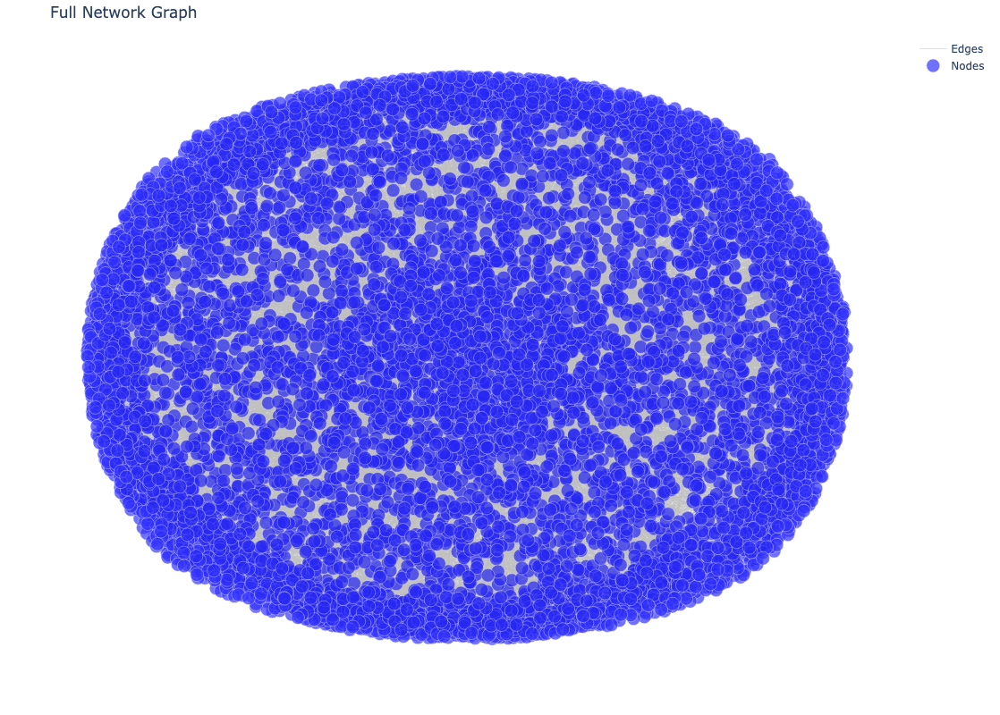

Pre-computing for 10 users: 10 nodes, 12 edges
Pre-computing for 60 users: 60 nodes, 138 edges
Pre-computing for 110 users: 110 nodes, 271 edges
Pre-computing for 160 users: 160 nodes, 438 edges
Pre-computing for 210 users: 210 nodes, 589 edges
Pre-computing for 260 users: 260 nodes, 745 edges
Pre-computing for 310 users: 310 nodes, 892 edges
Pre-computing for 360 users: 360 nodes, 1058 edges
Pre-computing for 410 users: 410 nodes, 1211 edges
Pre-computing for 460 users: 460 nodes, 1363 edges
Pre-computing for 500 users: 500 nodes, 1472 edges
Initial number of nodes (Top 500): 500


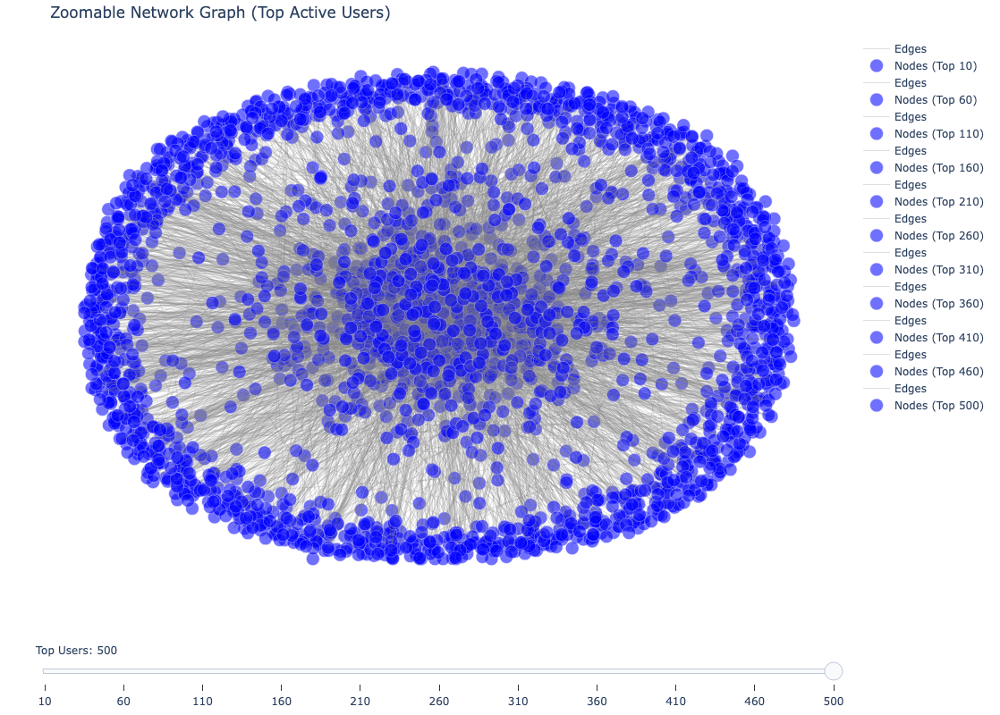

In [7]:

# Re-Connecting to the database (if in-case disconnected)
conn = sqlite3.connect('reddit_analysis.db', timeout=30)
cursor = conn.cursor()

G = nx.DiGraph()
cursor.execute('SELECT source, target, type FROM edges')
edges = cursor.fetchall()
for source, target, edge_type in edges:
    G.add_edge(source, target, type=edge_type)

print("Total Nodes:", G.number_of_nodes())
print("Total Edges:", G.number_of_edges())

pos = nx.spring_layout(G, k=0.15, iterations=50, scale=2.0)  # Adjusted for better distribution

edge_x, edge_y = [], []
for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.extend([x0, x1, None])
    edge_y.extend([y0, y1, None])

node_x = [pos[n][0] for n in G.nodes()]
node_y = [pos[n][1] for n in G.nodes()]
node_sizes = [15 for _ in G.nodes()]
node_color = 'blue'

# Create figure for the full graph
fig_full = go.Figure()

fig_full.add_trace(go.Scatter(x=edge_x, y=edge_y, mode='lines', line=dict(width=0.5, color='gray'),
                              hoverinfo='none', opacity=0.5, name='Edges'))

fig_full.add_trace(go.Scatter(x=node_x, y=node_y, mode='markers',
                              marker=dict(size=node_sizes, color=node_color, line=dict(width=0.5, color='white')),
                              text=[f"{n} (Degree: {G.degree(n)})" for n in G.nodes()],
                              hoverinfo='text', opacity=0.8, name='Nodes'))

fig_full.update_layout(
    title='Full Network Graph',
    hovermode='closest',
    xaxis=dict(showgrid=False, zeroline=False, visible=False, autorange=True),
    yaxis=dict(showgrid=False, zeroline=False, visible=False, autorange=True),
    width=800,
    height=800,
    plot_bgcolor='white',
    margin=dict(l=40, r=40, t=40, b=40)
)

fig_full.write_html('full_network_graph.html')
fig_full.show()

# Subgraphs for zooming (top users from 10 to 500)
max_users = 500
step_size = 50
user_ranges = list(range(10, max_users + 1, step_size)) + [max_users]  # [10, 60, 110, ..., 500]
subgraphs = {}
positions = {}
all_traces = []

for num_users in user_ranges:
    top_users = sorted(G.degree, key=lambda x: x[1], reverse=True)[:num_users]
    top_nodes = [n[0] for n in top_users]
    subgraphs[num_users] = G.subgraph(top_nodes)
    positions[num_users] = nx.spring_layout(subgraphs[num_users], k=0.15, iterations=50, scale=2.0)

    num_nodes = len(subgraphs[num_users].nodes())
    num_edges = len(subgraphs[num_users].edges())
    print(f"Pre-computing for {num_users} users: {num_nodes} nodes, {num_edges} edges")

    edge_x, edge_y = [], []
    for edge in subgraphs[num_users].edges():
        x0, y0 = positions[num_users][edge[0]]
        x1, y1 = positions[num_users][edge[1]]
        edge_x.extend([x0, x1, None])
        edge_y.extend([y0, y1, None])
    edge_trace = go.Scatter(x=edge_x, y=edge_y, mode='lines', line=dict(width=0.5, color='gray'),
                            hoverinfo='none', opacity=0.5, name='Edges')
    all_traces.append(edge_trace)

    node_x = [positions[num_users][n][0] for n in subgraphs[num_users].nodes()]
    node_y = [positions[num_users][n][1] for n in subgraphs[num_users].nodes()]
    node_sizes = [15 for _ in subgraphs[num_users].nodes()]  # All nodes same size
    node_color = 'blue'  # Changed from gray to blue

    node_trace = go.Scatter(x=node_x, y=node_y, mode='markers',
                            marker=dict(size=node_sizes, color=node_color, line=dict(width=0.5, color='white')),
                            text=[f"{n} (Degree: {subgraphs[num_users].degree(n)})" for n in subgraphs[num_users].nodes()],
                            hoverinfo='text', opacity=0.8, name=f'Nodes (Top {num_users})')
    all_traces.append(node_trace)

fig_zoom = go.Figure()

for trace in all_traces:
    fig_zoom.add_trace(trace)

fig_zoom.update_layout(
    title='Zoomable Network Graph (Top Active Users)',
    hovermode='closest',
    xaxis=dict(showgrid=False, zeroline=False, visible=False, autorange=True),
    yaxis=dict(showgrid=False, zeroline=False, visible=False, autorange=True),
    width=800,
    height=800,
    plot_bgcolor='white',
    margin=dict(l=40, r=40, t=40, b=40),
    sliders=[{
        'active': len(user_ranges) - 1,
        'currentvalue': {'prefix': 'Top Users: '},
        'pad': {'t': 50},
        'steps': [
            {
                'args': [
                    {'visible': [i // 2 == step for i in range(len(all_traces))]},
                    {'title': f'Zoomable Network Graph (Top {num} Active Users)'}
                ],
                'label': str(num),
                'method': 'update'
            } for step, num in enumerate(user_ranges)
        ]
    }]
)

initial_nodes = len(subgraphs[max_users].nodes())
print(f"Initial number of nodes (Top {max_users}): {initial_nodes}")

fig_zoom.write_html('zoomable_network_graph.html')
fig_zoom.show()

## Top 10 Active users
- Few of the nodes are not connected as they are the top active users but were connected to [deleted] users.
- This graph is similar as Zoomable graph above but it specifically gives only top 10 active users and also can be utilised to verify the above graph is working as expected.


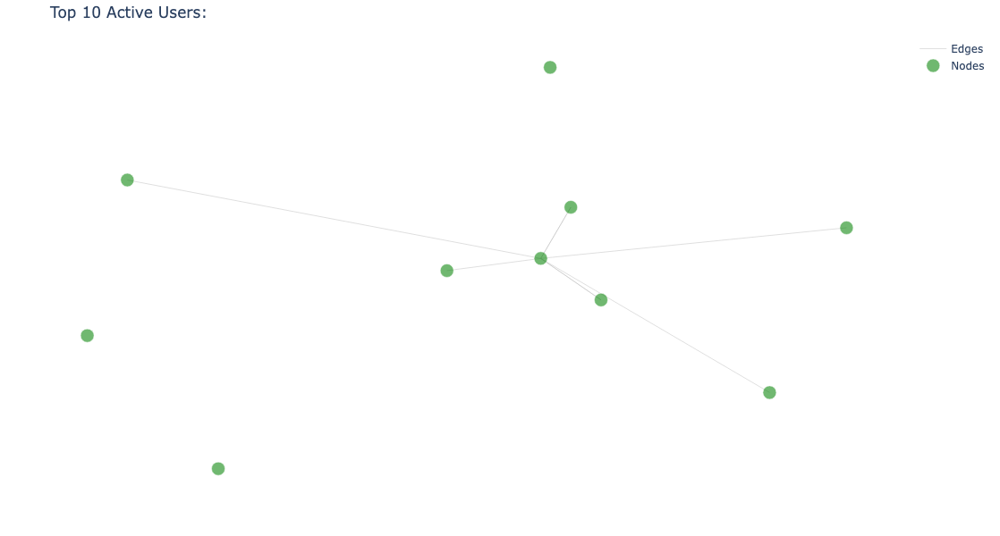

In [9]:
top_10_users = sorted(G.degree, key=lambda x: x[1], reverse=True)[:10]
top_10_nodes = [n[0] for n in top_10_users]
subgraph_10 = G.subgraph(top_10_nodes)
pos_10 = nx.spring_layout(subgraph_10, k=0.5, iterations=50)

edge_x_10, edge_y_10 = [], []
for edge in subgraph_10.edges():
    x0, y0 = pos_10[edge[0]]
    x1, y1 = pos_10[edge[1]]
    edge_x_10.extend([x0, x1, None])
    edge_y_10.extend([y0, y1, None])

node_x_10 = [pos_10[n][0] for n in subgraph_10.nodes()]
node_y_10 = [pos_10[n][1] for n in subgraph_10.nodes()]
node_sizes_10 = [15 for _ in subgraph_10.nodes()]  # All nodes same size
node_color_10 = 'green'

fig_top10 = go.Figure()

fig_top10.add_trace(go.Scatter(x=edge_x_10, y=edge_y_10, mode='lines', line=dict(width=0.5, color='gray'),
                               hoverinfo='none', opacity=0.5, name='Edges'))

fig_top10.add_trace(go.Scatter(x=node_x_10, y=node_y_10, mode='markers',
                               marker=dict(size=node_sizes_10, color=node_color_10, line=dict(width=0.5, color='white')),
                               text=[f"{n} (Degree: {subgraph_10.degree(n)})" for n in subgraph_10.nodes()],
                               hoverinfo='text', opacity=0.8, name='Nodes'))

fig_top10.update_layout(
    title='Top 10 Active Users:',
    hovermode='closest',
    xaxis=dict(showgrid=False, zeroline=False, visible=False, autorange=True),
    yaxis=dict(showgrid=False, zeroline=False, visible=False, autorange=True),
    width=600,
    height=600,
    plot_bgcolor='white',
    margin=dict(l=40, r=40, t=40, b=40)
)

fig_top10.write_html('top_10_users_network.html')
fig_top10.show()


## Chapter 3: Network Analysis

**Research Question 1:** Do Super users in the InvestmentClub community preferentially interact with each other, or do they engage more with less active users, and how does this impact community cohesion?

Super users for interaction analysis: ['Zurevu', 'The-Techie', 'EffectiveWait', 'fitnesssova', 'Denise1111']
Interaction counts: interaction_type
Other                 16159
Super-to-Non-Super     1890
Super-to-Super          208
Name: count, dtype: int64


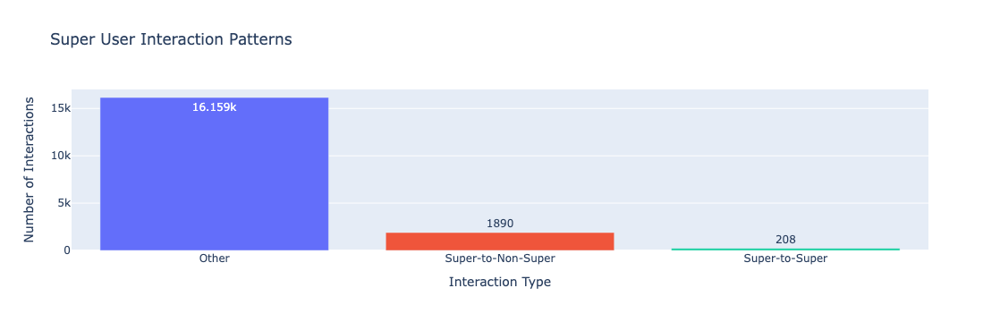

In [12]:
top_users = [user for user, _ in top_10_users[:5]]
print("Super users for interaction analysis:", top_users)

edges_df = pd.DataFrame(edges, columns=['source', 'target', 'type'])

edges_df['source_is_super'] = edges_df['source'].isin(top_users)
edges_df['target_is_super'] = edges_df['target'].isin(top_users)

edges_df['interaction_type'] = edges_df.apply(
    lambda row: 'Super-to-Super' if row['source_is_super'] and row['target_is_super']
    else 'Super-to-Non-Super' if row['source_is_super']
    else 'Other', axis=1)

interaction_counts = edges_df['interaction_type'].value_counts()
print("Interaction counts:", interaction_counts)

interaction_fig = px.bar(
    x=interaction_counts.index,
    y=interaction_counts.values,
    title='Super User Interaction Patterns',
    labels={'x': 'Interaction Type', 'y': 'Count'},
    color=interaction_counts.index,
    text_auto=True
)
interaction_fig.update_layout(
    xaxis_title='Interaction Type',
    yaxis_title='Number of Interactions',
    showlegend=False
)
interaction_fig.show()
interaction_fig.write_html('super_user_interaction_patterns.html')

**Output Observations:**
- Super Users Identified: The top 5 super users are ['Zurevu', 'The-Techie', 'EffectiveWait', 'fitnesssova', 'Denise111'], indicating these users have the highest degree centrality (most interactions) in the "InvestmentClub" community.

**Interaction Counts:**
- Other: 16,159 interactions (non-super user interactions).
- Super-to-Non-Super: 1,890 interactions.
- Super-to-Super: 208 interactions.

**Research Question 2:** Does user activity in the InvestmentClub community follow distinct temporal patterns, and how do these patterns influence community engagement over time?

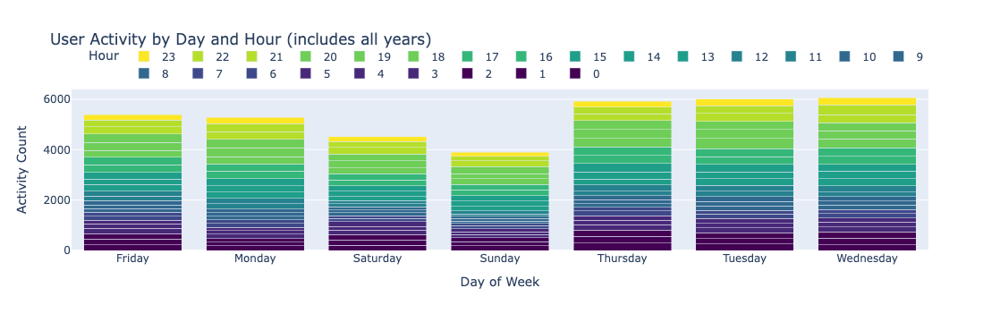

In [15]:
# Aggregate activity by day and hour
# process activity data processing
activity_df = pd.read_sql_query('SELECT created_utc, author FROM comments UNION SELECT created_utc, author FROM submissions', conn)
activity_df['created_date'] = pd.to_datetime(activity_df['created_utc'], errors='coerce').dt.date
activity_df['day_of_week'] = pd.to_datetime(activity_df['created_utc'], errors='coerce').dt.day_name()
activity_df['hour'] = pd.to_datetime(activity_df['created_utc'], errors='coerce').dt.hour
activity_df['year'] = pd.to_datetime(activity_df['created_utc'], errors='coerce').dt.year

activity_by_day_hour = activity_df.groupby(['day_of_week', 'hour']).size().reset_index(name='activity_count')
pivot_df = activity_by_day_hour.pivot(index='day_of_week', columns='hour', values='activity_count').fillna(0)
fig = go.Figure()
unique_days = pivot_df.index.tolist()
unique_hours = sorted(pivot_df.columns)  # Ensure all hours (0-23) are included

colors = px.colors.sequential.Viridis
hour_colors = {hour: colors[int(hour * (len(colors) - 1) / 23)] for hour in range(24)}

for day in unique_days:
    day_data = pivot_df.loc[day]
    for hour in range(24):
        count = day_data.get(hour, 0)
        if count > 0:
            fig.add_trace(go.Bar(
                name=f"{hour}",
                x=[day],
                y=[count],
                marker_color=hour_colors[hour],
                customdata=[[hour]],
                hovertemplate='Hour: %{customdata[0]}<br>Day: %{x}<br>Activity Count: %{y}<extra></extra>',
                showlegend=True if day == unique_days[0] else False 
            ))

fig.update_layout(
    barmode='stack',
    title='User Activity by Day and Hour (includes all years)',
    xaxis_title='Day of Week',
    yaxis_title='Activity Count',
    legend_title='Hour',
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
    showlegend=True
)

fig.show()
fig.write_html('user_activity_by_day_hour.html')

**Output Observation:**
Activity peaked mid-week (Tuesday: 5,974, Wednesday: 5,955, Thursday: 5,797) and in hours 15-22 (e.g., Wednesday hour 22: 399), aligning with U.S. market close. Weekends showed lower activity (Sunday: 3,773).

**Research Question 3:** What role do super users play in the InvestmentClub community, and how central are they to its cohesiveness and functioning?

User: Zurevu, Degree: 0.3165967645296585, Betweenness: 0.04350624795514103, Clustering: 0.00016233985266833034
User: The-Techie, Degree: 0.024685440383463153, Betweenness: 0.0, Clustering: 0.0017286289367748047
User: EffectiveWait, Degree: 0.01737567405632115, Betweenness: 0.0020521294157498774, Clustering: 0.002921455938697318
User: fitnesssova, Degree: 0.01641701617735171, Betweenness: 0.0, Clustering: 0.0025225418634607128
User: Denise1111, Degree: 0.012342720191731577, Betweenness: 0.0, Clustering: 0.00019036740909956216
User: Piterst, Degree: 0.01018573996405033, Betweenness: 0.0009414623936843166, Clustering: 0.009700176366843033
User: InvestmentClub-ModTeam, Degree: 0.01006590772917915, Betweenness: 0.0, Clustering: 0.00014343086632243257
User: StockerFinance, Degree: 0.007908927501497904, Betweenness: 0.0010223367056016112, Clustering: 0.007692307692307693
User: InG75__, Degree: 0.007429598562013182, Betweenness: 0.0, Clustering: 0
User: albnasc, Degree: 0.0073097663271420015, 

/var/folders/z2/7bfjvcb935ggt0y_pmx4_wtm0000gn/T/ipykernel_55467/3328965155.py:28: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.

/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



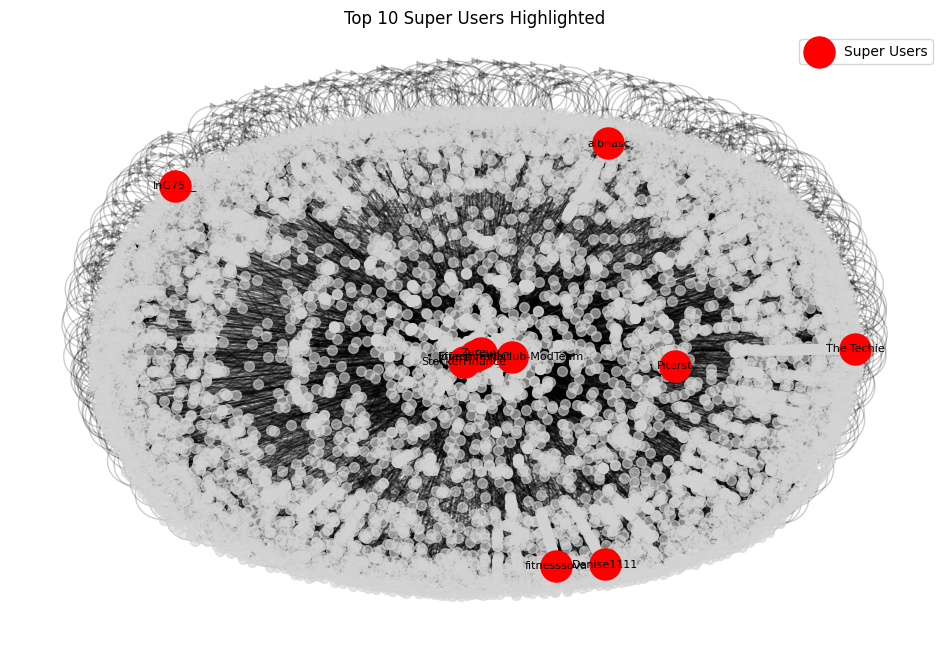

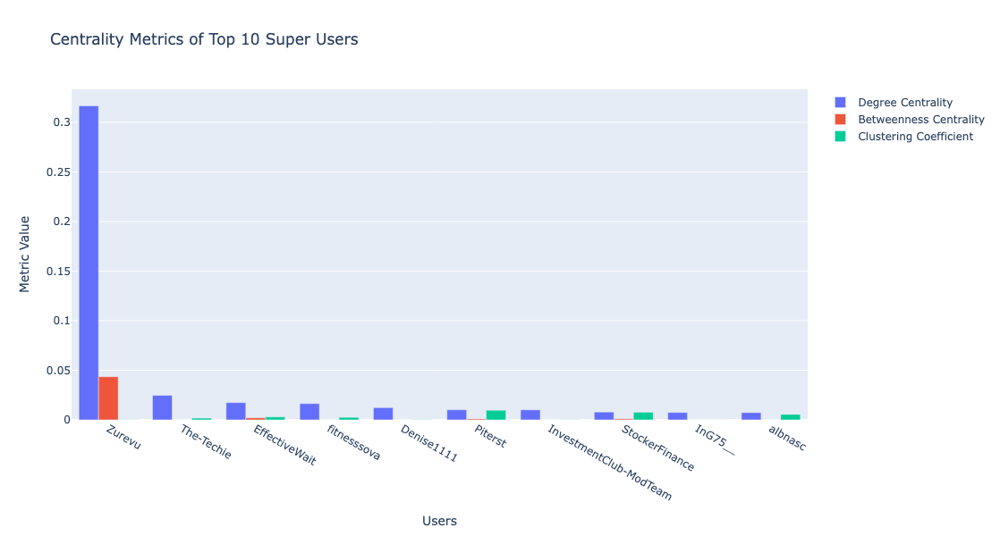

In [18]:
import networkx as nx
import matplotlib.pyplot as plt
import plotly.graph_objects as go

degree_centrality = nx.degree_centrality(G)
betweenness_centrality = nx.betweenness_centrality(G)
clustering_coeff = nx.clustering(G)
top_super_users = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
for user, degree in top_super_users:
    print(f"User: {user}, Degree: {degree}, Betweenness: {betweenness_centrality[user]}, Clustering: {clustering_coeff[user]}")
print("Top users analysed:", len(top_super_users))

# Network Graph Visualization
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G)  # Layout for better visualization
nx.draw_networkx_nodes(G, pos, node_size=50, node_color='lightgray', alpha=0.6)
nx.draw_networkx_edges(G, pos, alpha=0.2)

# top super users Highlight
super_user_nodes = [user for user, _ in top_super_users]
node_sizes = [500 if user in super_user_nodes else 50 for user in G.nodes()]
nx.draw_networkx_nodes(G, pos, nodelist=super_user_nodes, node_size=500, node_color='red', label='Super Users')
nx.draw_networkx_labels(G, pos, labels={user: user for user in super_user_nodes}, font_size=8)

plt.title('Top 10 Super Users Highlighted')
plt.legend()
plt.axis('off')
plt.savefig('network_graph_super_users.png')
plt.show()

# Centrality Distribution Plot (Bar Chart)
users, degrees = zip(*top_super_users)
betweenness_values = [betweenness_centrality[user] for user in users]
clustering_values = [clustering_coeff[user] for user in users]

fig = go.Figure(data=[
    go.Bar(name='Degree Centrality', x=users, y=degrees),
    go.Bar(name='Betweenness Centrality', x=users, y=betweenness_values),
    go.Bar(name='Clustering Coefficient', x=users, y=clustering_values)
])
fig.update_layout(
    title='Centrality Metrics of Top 10 Super Users',
    xaxis_title='Users',
    yaxis_title='Metric Value',
    barmode='group',
    width=1000,
    height=600
)
fig.write_html('centrality_metrics.html')
fig.show()

**Output Observation:**
- The top super user, Zurevu, has a high degree centrality (0.3166), suggesting they are highly connected, but a low clustering coefficient (0.000162) and moderate betweenness (0.0435), indicating they are a hub but not necessarily a cohesive center.
- Other users like The-Techie and EffectiveWait have lower centrality values, with varying betweenness and clustering, suggesting diverse roles (e.g., Piterst has a higher clustering coefficient, indicating a more tightly knit local network).
- The InvestmentClub-ModTeam appears, which might reflect moderator activity rather than organic user engagement.

## Chapter 4: Creativity tasks

**1. Sentiment Analysis with temporal trends**

Loaded 733 stopwords from stopwordFile.txt
Added sentiment column to comments table.
Added cleaned_body column to comments table.
Total comments to analyze: 20171
Sentiment analysis and text preprocessing completed and updated in database.
Sample sentiments (after stopword removal): [('I think this is a great idea!', 'think great idea', 0.6249), ('what he/she said^!!', 'heshe', 0.0), ("Which simulator are you going to use, the only reason why I ask is because I know some don't allow you to buy penny stocks.  Can we suggest penny stocks?", 'simulator going only reason ask know dont allow buy penny stocks can suggest penny stocks', -0.1695), ("It depends on everybody's vote but I'm guessing that we won't be buying penny stocks. I'll have to check if the simulator can buy penny stocks. ", 'depends everybodys vote im guessing wont buying penny stocks ill check simulator can buy penny stocks', -0.4215), ('Ticker: CHK', 'ticker chk', 0.0)]
Sample submissions: [('p6vn4', 3), ('p6uck', 6), ('p

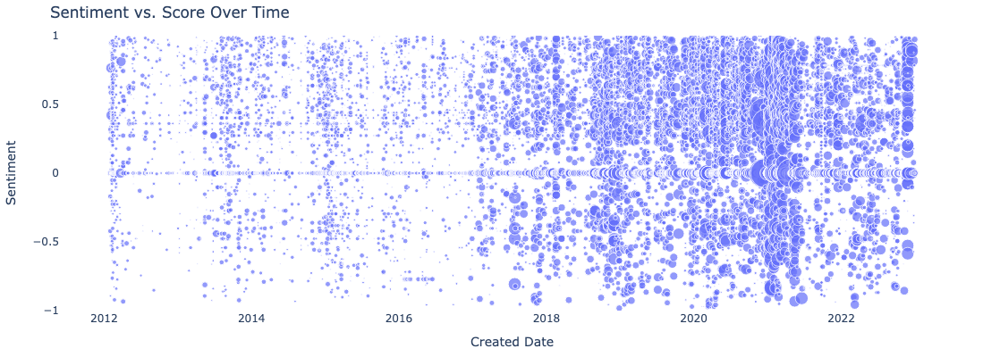

In [22]:
import sqlite3
import pandas as pd
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import numpy as np
import plotly.graph_objects as go
import re

# Connect to the database
conn = sqlite3.connect('reddit_analysis.db', timeout=30)
cursor = conn.cursor()

# Load stopwords from stopwordFile.txt (do this once)
with open('stopwordFile.txt', 'r') as f:
    stopwords = set(line.strip().lower() for line in f if line.strip())
print(f"Loaded {len(stopwords)} stopwords from stopwordFile.txt")

# Function to preprocess text by removing stopwords and cleaning
def preprocess_text(text, stopwords):
    if text and isinstance(text, str):  # Ensure text is not None and is a string
        # Remove non-word and non-space characters
        cleaned_text = re.sub(r'[^\w\s]', '', text.lower())
        words = cleaned_text.split()
        cleaned_words = [word for word in words if word.lower() not in stopwords]
        return ' '.join(cleaned_words)
    return ''

# Initialize sentiment analyzer
analyzer = SentimentIntensityAnalyzer()

# Check if sentiment and cleaned_body columns exist in comments table
cursor.execute("PRAGMA table_info(comments)")
columns = [col[1] for col in cursor.fetchall()]
if 'sentiment' not in columns:
    cursor.execute('ALTER TABLE comments ADD COLUMN sentiment REAL')
    print("Added sentiment column to comments table.")
if 'cleaned_body' not in columns:
    cursor.execute('ALTER TABLE comments ADD COLUMN cleaned_body TEXT')
    print("Added cleaned_body column to comments table.")

# Update sentiment and cleaned_body for all comments
cursor.execute('SELECT body, rowid FROM comments')
rows = cursor.fetchall()
print(f"Total comments to analyze: {len(rows)}")
for body, rowid in rows:
    if body:  # Ensure body is not None or empty
        cleaned_body = preprocess_text(body, stopwords)  # Preprocess text
        sentiment = analyzer.polarity_scores(cleaned_body)['compound'] if cleaned_body else 0
        cursor.execute('UPDATE comments SET sentiment = ?, cleaned_body = ? WHERE rowid = ?', (sentiment, cleaned_body, rowid))
conn.commit()
print("Sentiment analysis and text preprocessing completed and updated in database.")

# Fetch and verify sample sentiments
cursor.execute('SELECT body, cleaned_body, sentiment FROM comments LIMIT 5')
print("Sample sentiments (after stopword removal):", cursor.fetchall())

# Check submissions data
cursor.execute('SELECT id, score FROM submissions LIMIT 5')
print("Sample submissions:", cursor.fetchall())

# Fetch data for visualization (filter score > 0)
df = pd.read_sql_query('''
SELECT c.created_utc, c.sentiment, s.score
FROM comments c LEFT JOIN submissions s ON substr(c.link_id, 4) = s.id
WHERE c.sentiment IS NOT NULL AND s.score > 0
''', conn)
print(f"DataFrame shape: {df.shape}")
print(f"Sample data:\n{df.head()}")
print(f"Missing scores: {df['score'].isna().sum()}")

# Check for valid data
if df.empty:
    print("Warning: DataFrame is empty. Check database joins or sentiment data.")
else:
    # Bin created_utc by day for scatter plot
    df['created_date'] = pd.to_datetime(df['created_utc']).dt.date
    size = df['score'].fillna(5).astype(float)  # Use 5 as default size if score is NaN

    # Sentiment vs. Score Over Time (binned by date)
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=df['created_date'], y=df['sentiment'], mode='markers', marker=dict(size=size, sizemode='area'),
                             text=df.apply(lambda row: f"Score: {row['score'] if pd.notna(row['score']) else 'N/A'}", axis=1),
                             hoverinfo='text+x+y', name='Sentiment'))
    fig.update_layout(
        title='Sentiment vs. Score Over Time',
        xaxis_title='Created Date',
        yaxis_title='Sentiment',
        xaxis=dict(showgrid=False, zeroline=False),
        yaxis=dict(showgrid=False, zeroline=False, range=[-1, 1]),
        width=800,
        height=400,
        plot_bgcolor='white',
        margin=dict(l=40, r=40, t=40, b=40)
    )
    fig.write_html('sentiment_time_with_stopwords.html')
    fig.show()

conn.close()

**2. InvestmentClub Community Insights Dashboard**

In [24]:
pip install dash

Note: you may need to restart the kernel to use updated packages.


In [25]:
import sqlite3
import pandas as pd
import networkx as nx
import plotly.graph_objects as go
import plotly.express as px
from dash import Dash, dcc, html
from dash.dependencies import Input, Output

conn = sqlite3.connect('reddit_analysis.db', timeout=30)
cursor = conn.cursor()

# network data processing
G = nx.DiGraph()
cursor.execute('SELECT source, target, type FROM edges')
edges = cursor.fetchall()
G.add_edges_from((source, target) for source, target, _ in edges)
degree_centrality = nx.degree_centrality(G)
betweenness_centrality = nx.betweenness_centrality(G)
eigenvector_centrality = nx.eigenvector_centrality(G, max_iter=1000)

# process activity data processing
activity_df = pd.read_sql_query('SELECT created_utc, author FROM comments UNION SELECT created_utc, author FROM submissions', conn)
activity_df['created_date'] = pd.to_datetime(activity_df['created_utc'], errors='coerce').dt.date
activity_df['day_of_week'] = pd.to_datetime(activity_df['created_utc'], errors='coerce').dt.day_name()
activity_df['hour'] = pd.to_datetime(activity_df['created_utc'], errors='coerce').dt.hour
activity_df['year'] = pd.to_datetime(activity_df['created_utc'], errors='coerce').dt.year

# sentiment data
comments_df = pd.read_sql_query('SELECT id, cleaned_body, sentiment, link_id, author, ups, created_utc FROM comments WHERE cleaned_body IS NOT NULL', conn)
submissions_df = pd.read_sql_query('SELECT id, title, selftext, score, author, ups, created_utc FROM submissions WHERE (title IS NOT NULL OR selftext IS NOT NULL)', conn)
comments_df['created_date'] = pd.to_datetime(comments_df['created_utc'], errors='coerce').dt.date
submissions_df['created_date'] = pd.to_datetime(submissions_df['created_utc'], errors='coerce').dt.date
comments_df['year'] = pd.to_datetime(comments_df['created_utc'], errors='coerce').dt.year
submissions_df['year'] = pd.to_datetime(submissions_df['created_utc'], errors='coerce').dt.year

def map_emotion(sentiment):
    if sentiment > 0.3: return 'Happy'
    elif sentiment < -0.3: return 'Sad'
    elif sentiment < 0: return 'Neutral Negative'
    else: return 'Neutral Positive'
comments_df['emotion'] = comments_df['sentiment'].apply(map_emotion)

# Aggregate data for graphs
top_active_users = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
top_upvoted_users = pd.concat([comments_df, submissions_df]).groupby('author')['ups'].sum().sort_values(ascending=False)[:10]
mention_freq = pd.DataFrame(edges, columns=['source', 'target', 'type']).groupby(['source', 'target']).size().reset_index(name='mentions')[:10]
growth_df = activity_df.groupby(pd.to_datetime(activity_df['created_utc'], errors='coerce').dt.to_period('M')).size().reset_index(name='count')
growth_df['month'] = growth_df['created_utc'].astype(str)
top_users = [user for user, _ in top_active_users[:5]]
sentiment_trend = comments_df[comments_df['author'].isin(top_users)].groupby(['created_date', 'author'])['sentiment'].mean().reset_index()

emotion_counts = comments_df['emotion'].value_counts()
total = emotion_counts.sum()
labels_with_counts = [f"{emotion} ({count})" for emotion, count in zip(emotion_counts.index, emotion_counts.values)]
emotion_fig = go.Figure(data=[
    go.Pie(labels=labels_with_counts, values=emotion_counts.values, textinfo='label+percent', showlegend=True)
])
emotion_fig.update_layout(title='Emotion Distribution (All Years)')

active_users = comments_df['author'].value_counts().head(10).sort_values(ascending=True)
active_fig = px.bar(x=active_users.values, y=active_users.index, orientation='h', title='Top Active Users (All Years)')

combined_df = pd.concat([comments_df, submissions_df])
upvoted_users = combined_df.groupby('author')['ups'].sum().sort_values(ascending=False).head(10).sort_values(ascending=True)
upvoted_fig = px.bar(x=upvoted_users.values, y=upvoted_users.index, orientation='h', title='Top Upvoted Users (All Years)')

top_eigen = sorted(eigenvector_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
top_eigen_df = pd.DataFrame(top_eigen, columns=['user', 'centrality']).sort_values('centrality', ascending=True)
influence_fig = px.bar(x=top_eigen_df['centrality'], y=top_eigen_df['user'], orientation='h', title='Top Influential Users (All Years)')

top_degree = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
top_degree_df = pd.DataFrame(top_degree, columns=['user', 'centrality']).sort_values('centrality', ascending=True)
importance_fig = px.bar(x=top_degree_df['centrality'], y=top_degree_df['user'], orientation='h', title='Top Important Users (All Years)')

mention_freq_with_dates = mention_freq.merge(comments_df[['author', 'created_utc']], left_on='source', right_on='author', how='left')
if not mention_freq_with_dates.empty:
    mention_fig = px.scatter(mention_freq_with_dates, x='source', y='target', size='mentions', title='Top Mentions (All Years)')
else:
    mention_fig = go.Figure(layout=go.Layout(title='Top Mentions (All Years) - No Data'))

top_between = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
top_between_df = pd.DataFrame(top_between, columns=['user', 'centrality']).sort_values('centrality', ascending=True)
flow_fig = px.bar(x=top_between_df['centrality'], y=top_between_df['user'], orientation='h', title='Top Information Flow Users (All Years)')

growth_fig = px.line(growth_df, x='month', y='count', title='Community Growth Over Time')

sentiment_fig = px.line(sentiment_trend, x='created_date', y='sentiment', color='author', title='Sentiment Trend by Top User')

# Initialize Dash app
app = Dash(__name__)

app.layout = html.Div([
    html.H1("InvestmentClub Community Insights Dashboard", style={'textAlign': 'center', 'color': '#003087', 'fontSize': 24}),
    dcc.Dropdown(
        id='year-dropdown',
        options=[{'label': str(year), 'value': year} for year in sorted(activity_df['year'].unique()) if pd.notna(year)],
        value=None,
        placeholder="Select a Year",
        style={'width': '50%', 'margin': 'auto'}
    ),
    html.Div([
        html.Div(dcc.Graph(id='emotion-graph', figure=emotion_fig), style={'width': '33%', 'display': 'inline-block', 'padding': '10px'}),
        html.Div(dcc.Graph(id='growth-graph', figure=growth_fig), style={'width': '33%', 'display': 'inline-block', 'padding': '10px'}),
        html.Div(dcc.Graph(id='mention-graph', figure=mention_fig), style={'width': '33%', 'display': 'inline-block', 'padding': '10px'})
    ], style={'display': 'flex'}),
    html.Div([
        html.Div(dcc.Graph(id='active-graph', figure=active_fig), style={'width': '33%', 'display': 'inline-block', 'padding': '10px'}),
        html.Div(dcc.Graph(id='upvoted-graph', figure=upvoted_fig), style={'width': '33%', 'display': 'inline-block', 'padding': '10px'}),
        html.Div(dcc.Graph(id='influence-graph', figure=influence_fig), style={'width': '33%', 'display': 'inline-block', 'padding': '10px'})
    ], style={'display': 'flex'}),
    html.Div([
        html.Div(dcc.Graph(id='importance-graph', figure=importance_fig), style={'width': '33%', 'display': 'inline-block', 'padding': '10px'}),
        html.Div(dcc.Graph(id='flow-graph', figure=flow_fig), style={'width': '33%', 'display': 'inline-block', 'padding': '10px'}),
        html.Div(dcc.Graph(id='sentiment-graph', figure=sentiment_fig), style={'width': '33%', 'display': 'inline-block', 'padding': '10px'})
    ], style={'display': 'flex'})
], style={'backgroundColor': '#F5F5F5', 'padding': '20px'})

@app.callback(
    [Output('emotion-graph', 'figure'),
     Output('growth-graph', 'figure'),
     Output('mention-graph', 'figure'),
     Output('active-graph', 'figure'),
     Output('upvoted-graph', 'figure'),
     Output('influence-graph', 'figure'),
     Output('importance-graph', 'figure'),
     Output('flow-graph', 'figure'),
     Output('sentiment-graph', 'figure')],
    [Input('year-dropdown', 'value')]
)
def update_graphs(selected_year):
    if selected_year is None:
        return emotion_fig, growth_fig, mention_fig, active_fig, upvoted_fig, influence_fig, importance_fig, flow_fig, sentiment_fig

    filtered_comments = comments_df[comments_df['year'] == selected_year]
    filtered_submissions = submissions_df[submissions_df['year'] == selected_year]
    filtered_activity = activity_df[activity_df['year'] == selected_year]
    filtered_edges = [(s, t) for s, t, _ in edges if s in filtered_comments['author'].values or t in filtered_comments['author'].values]

    G_filtered = nx.DiGraph()
    G_filtered.add_edges_from(filtered_edges)
    degree_centrality_filtered = nx.degree_centrality(G_filtered)
    betweenness_centrality_filtered = nx.betweenness_centrality(G_filtered)
    eigenvector_centrality_filtered = nx.eigenvector_centrality(G_filtered, max_iter=1000)

    emotion_counts = filtered_comments['emotion'].value_counts()
    labels_with_counts = [f"{emotion} ({count})" for emotion, count in zip(emotion_counts.index, emotion_counts.values)]
    emotion_fig_new = go.Figure(data=[
        go.Pie(labels=labels_with_counts, values=emotion_counts.values, textinfo='label+percent', showlegend=True)
    ])
    emotion_fig_new.update_layout(title=f'Emotion Distribution ({selected_year})')

    growth_df_new = filtered_activity.groupby(pd.to_datetime(filtered_activity['created_utc'], errors='coerce').dt.to_period('M')).size().reset_index(name='count')
    growth_df_new['month'] = growth_df_new['created_utc'].astype(str)
    growth_fig_new = px.line(growth_df_new, x='month', y='count', title=f'Community Growth Over Time ({selected_year})')

    mention_freq_new = pd.DataFrame(filtered_edges, columns=['source', 'target']).groupby(['source', 'target']).size().reset_index(name='mentions')[:10]
    mention_fig_new = px.scatter(mention_freq_new, x='source', y='target', size='mentions', title=f'Top Mentions ({selected_year})')

    active_users_new = filtered_comments['author'].value_counts().head(10).sort_values(ascending=True)
    active_fig_new = px.bar(x=active_users_new.values, y=active_users_new.index, orientation='h', title=f'Top Active Users ({selected_year})')

    combined_df_new = pd.concat([filtered_comments, filtered_submissions])
    upvoted_users_new = combined_df_new.groupby('author')['ups'].sum().sort_values(ascending=False).head(10).sort_values(ascending=True)
    upvoted_fig_new = px.bar(x=upvoted_users_new.values, y=upvoted_users_new.index, orientation='h', title=f'Top Upvoted Users ({selected_year})')

    top_eigen_new = sorted(eigenvector_centrality_filtered.items(), key=lambda x: x[1], reverse=True)[:10]
    top_eigen_df_new = pd.DataFrame(top_eigen_new, columns=['user', 'centrality']).sort_values('centrality', ascending=True)
    influence_fig_new = px.bar(x=top_eigen_df_new['centrality'], y=top_eigen_df_new['user'], orientation='h', title=f'Top Influential Users ({selected_year})')

    top_degree_new = sorted(degree_centrality_filtered.items(), key=lambda x: x[1], reverse=True)[:10]
    top_degree_df_new = pd.DataFrame(top_degree_new, columns=['user', 'centrality']).sort_values('centrality', ascending=True)
    importance_fig_new = px.bar(x=top_degree_df_new['centrality'], y=top_degree_df_new['user'], orientation='h', title=f'Top Important Users ({selected_year})')

    top_between_new = sorted(betweenness_centrality_filtered.items(), key=lambda x: x[1], reverse=True)[:10]
    top_between_df_new = pd.DataFrame(top_between_new, columns=['user', 'centrality']).sort_values('centrality', ascending=True)
    flow_fig_new = px.bar(x=top_between_df_new['centrality'], y=top_between_df_new['user'], orientation='h', title=f'Top Information Flow Users ({selected_year})')

    sentiment_trend_new = filtered_comments[filtered_comments['author'].isin(top_users)].groupby(['created_date', 'author'])['sentiment'].mean().reset_index()
    sentiment_fig_new = px.line(sentiment_trend_new, x='created_date', y='sentiment', color='author', title=f'Sentiment Trend by Top User ({selected_year})')

    return emotion_fig_new, growth_fig_new, mention_fig_new, active_fig_new, upvoted_fig_new, influence_fig_new, importance_fig_new, flow_fig_new, sentiment_fig_new

try:
    if __name__ == '__main__':
        app.run_server(debug=True, port=8051)
except OSError as e:
    print(f"Error: {e}. Please free port 8051 or use a different port.")
    conn.close()
    raise
else:
    conn.close()